# FL Map Reconstruction

Original and reconstructed photoluminescence maps for `CD_HM_dataset/1.csv`. Polynomial moments are not used in this reconstruction experiment.

In [4]:
import matplotlib.pyplot as plt

from fl_reconstruction_utils import (
    BASIS_LABELS_EN,
    BASIS_LABELS_RU,
    RECONSTRUCTION_BASIS_TYPES,
    RESULTS_DIR,
    cosine_fidelity,
    get_reconstruction_orders,
    load_fl_map,
    plot_reconstruction_pair,
    reconstruct_map,
)

In [5]:
MAP_ID = 1
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

map_data = load_fl_map(MAP_ID)
map_data.shape

(27, 201)

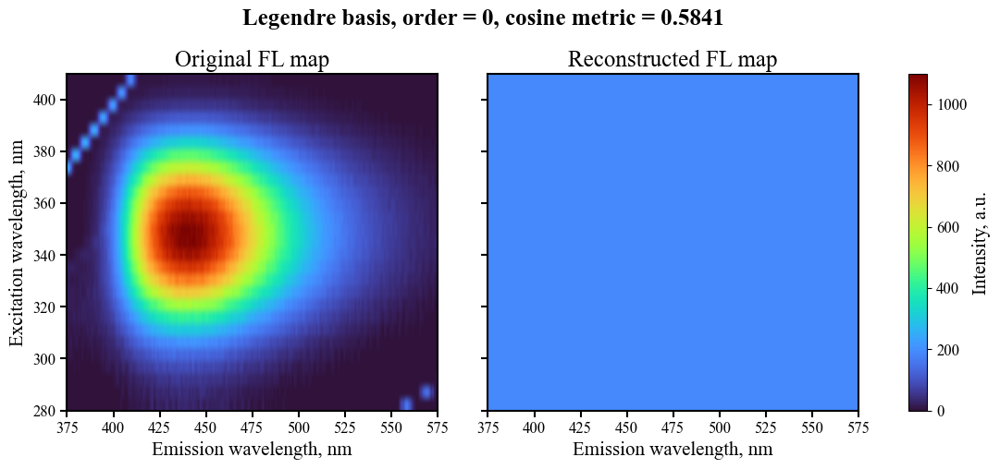

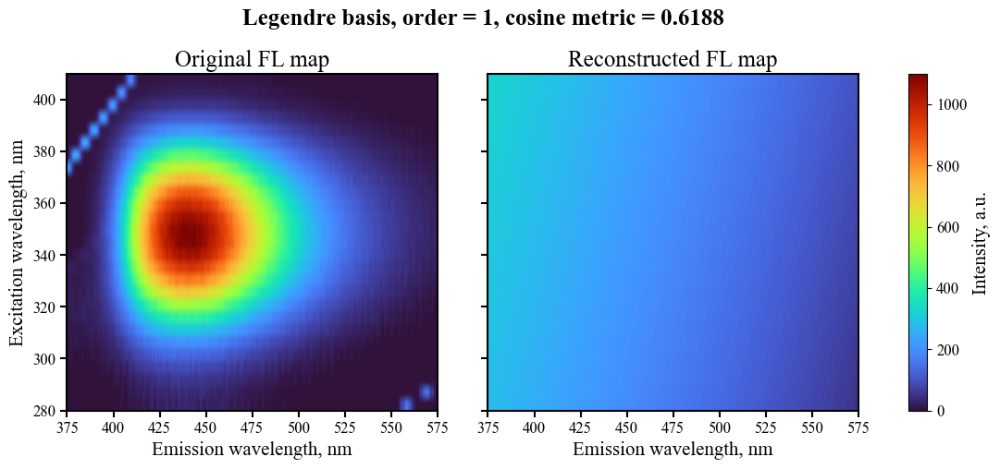

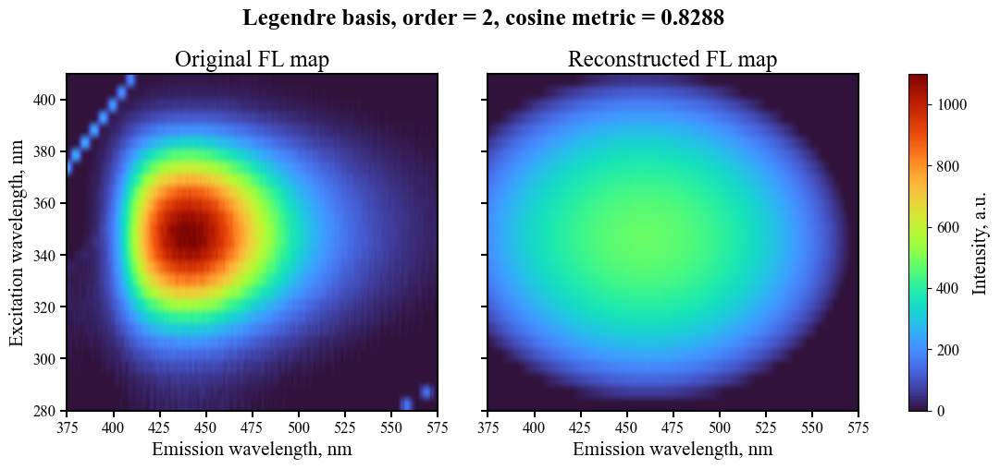

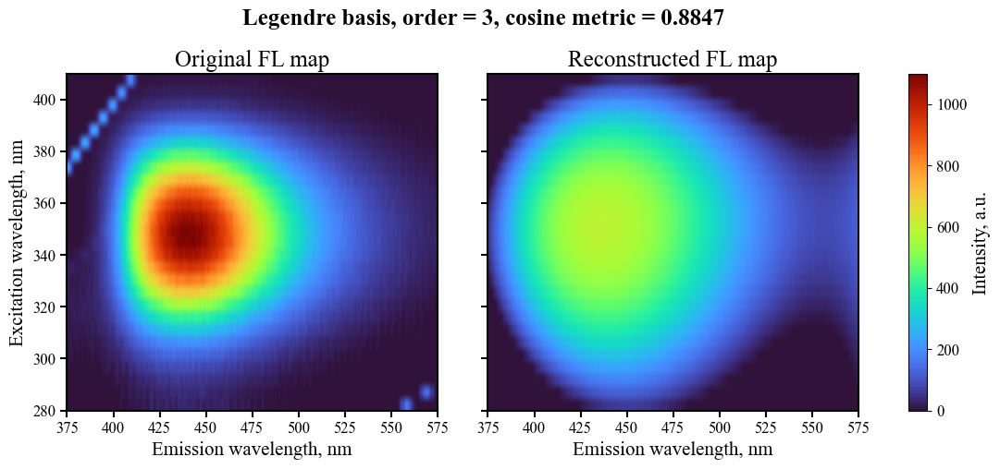

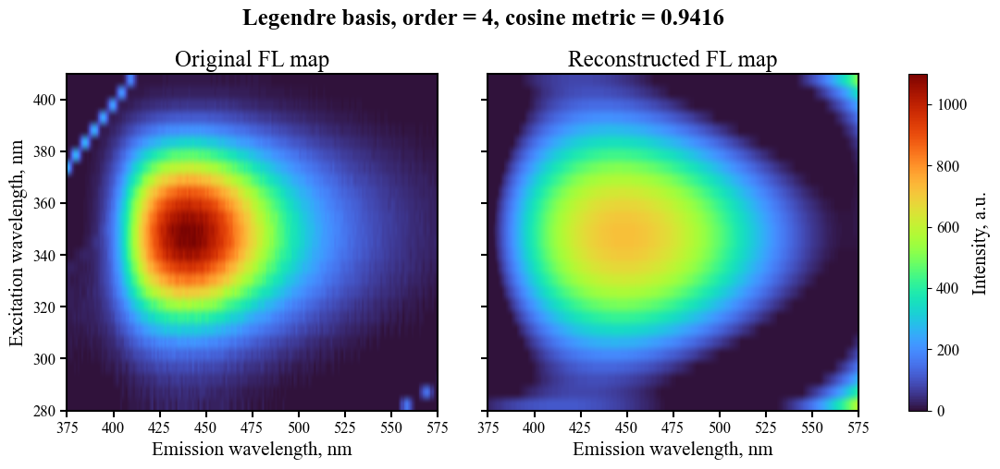

...

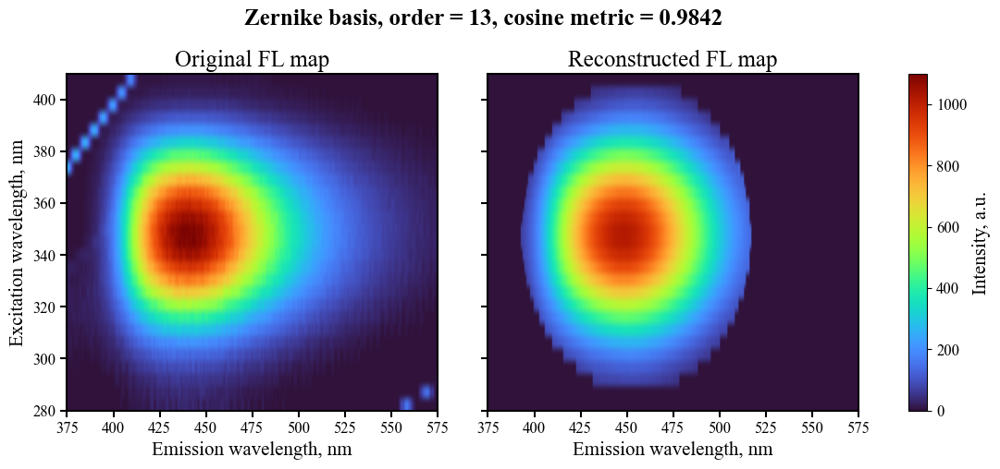

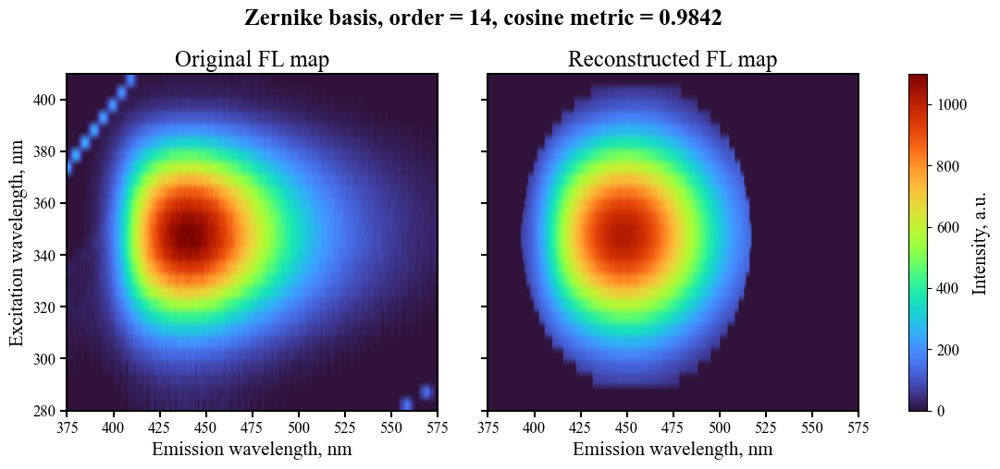

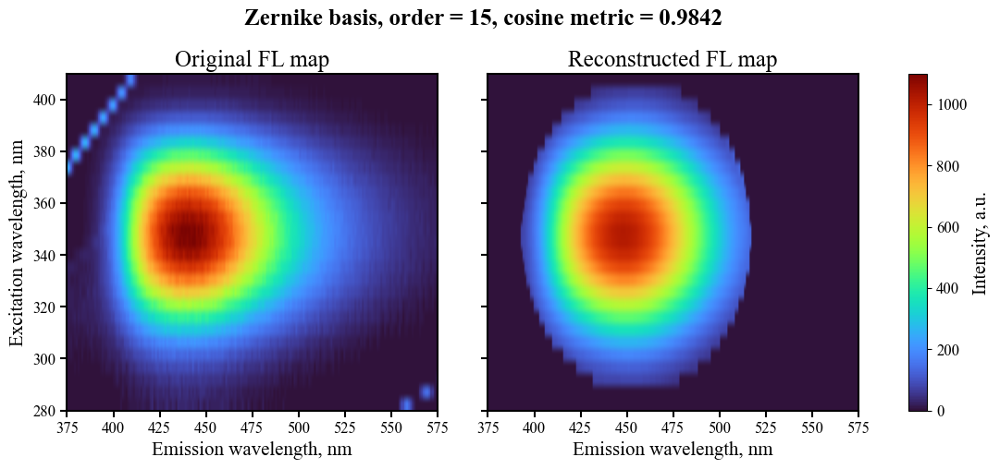

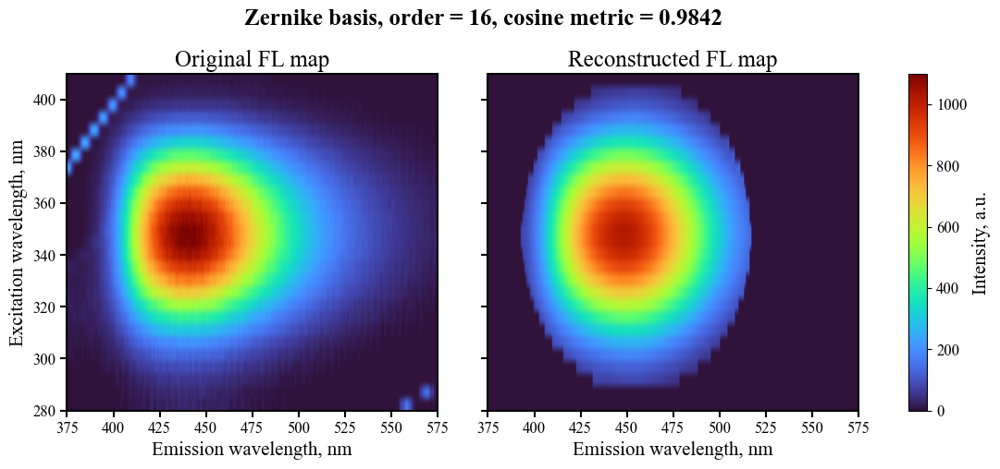

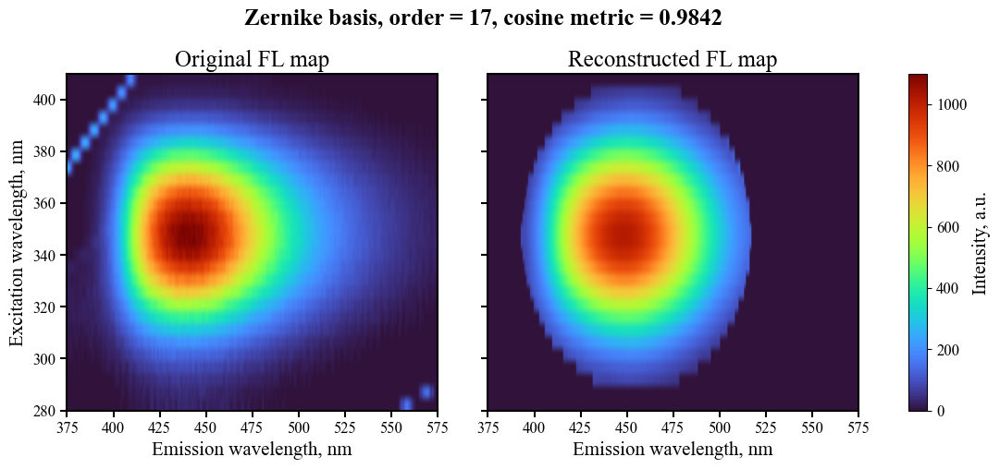

In [6]:
labels = {
    "original": "Original FL map",
    "reconstructed": "Reconstructed FL map",
    "emission": "Emission wavelength, nm",
    "excitation": "Excitation wavelength, nm",
    "intensity": "Intensity, a.u.",
}

for basis_type in RECONSTRUCTION_BASIS_TYPES:
    for order in get_reconstruction_orders(basis_type):
        reconstructed = reconstruct_map(map_data, basis_type, order)
        fidelity = cosine_fidelity(map_data, reconstructed)
        title = (
            f"{BASIS_LABELS_EN[basis_type]} basis, "
            f"order = {order}, cosine metric = {fidelity:.4f}"
        )
        fig = plot_reconstruction_pair(
            map_data,
            reconstructed,
            title=title,
            labels=labels,
        )
        figure_path = RESULTS_DIR / f"reconstruction_en_{basis_type}_order_{order}.png"
        fig.savefig(figure_path, dpi=300, bbox_inches="tight")
        plt.show()